## Face Alignment

- [`Happy-jihye`](https://github.com/happy-jihye)
- **landmark detector** : [`1adrianb/face-alignment`](https://github.com/1adrianb/face-alignment)
  - `pip install face-alignment`

In [1]:
import os

import matplotlib.pyplot as plt
from skimage import io
import face_alignment
import imageio
import natsort

In [2]:
fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._3D, flip_input=False)

image_path = "./vox1-ex/0.jpg"
input = io.imread(image_path)
preds = fa.get_landmarks(input)

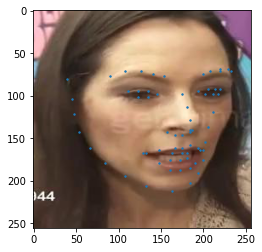

In [3]:
det = fa.get_landmarks_from_image(image_path)
plt.imshow(input)

for detection in det:
    plt.scatter(detection[:,0], detection[:,1], 2)

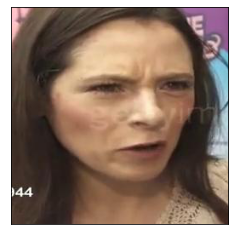

In [4]:
# Video
image_path = "./vox1-ex"
landmark_path = "./landmark"
if not os.path.exists(landmark_path):
    os.makedirs(landmark_path)

image_list = natsort.natsorted(os.listdir(image_path))

image_paths = [ os.path.join(image_path, im) for im in image_list if im.endswith('.jpg')] #[256,256,3] 
image_array = [ io.imread(path) for path in image_paths] #[256,256,3]

#len_image = len(image_array)
len_image = 50

for i in range(0, len_image):
    det = fa.get_landmarks_from_image(image_paths[i])
    im = plt.imshow(image_array[i])
    for detection in det:
        scat = plt.scatter(detection[:,0], detection[:,1], 2, c='b')
    plt.xticks([])
    plt.yticks([])
    plt.savefig(landmark_path + f"/landmark{i}.png", bbox_inches='tight', pad_inches=0)
    scat.remove()

In [5]:
speed_sec = { 'duration': 0.3 } #사진 넘기는 시간

landmark_images = [os.path.join(landmark_path, f"landmark{i}.png") for i in range(len_image)]

images = []
for im in landmark_images:
    images.append(imageio.imread(im))

imageio.mimsave(os.path.join(landmark_path, 'landmark.gif'), images, **speed_sec)


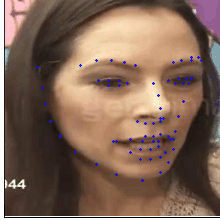

In [6]:
from IPython.display import Image
Image(open(os.path.join(landmark_path, 'landmark.gif'),'rb').read())

### Plot with color

In [14]:
# face-alignment/examples/detect_landmarks_in_image.py 
import collections

plot_style = dict(marker='o',
                  markersize=4,
                  linestyle='-',
                  lw=2)

pred_type = collections.namedtuple('prediction_type', ['slice', 'color'])
pred_types = {'face': pred_type(slice(0, 17), (0.682, 0.780, 0.909, 0.5)),
              'eyebrow1': pred_type(slice(17, 22), (1.0, 0.498, 0.055, 0.4)),
              'eyebrow2': pred_type(slice(22, 27), (1.0, 0.498, 0.055, 0.4)),
              'nose': pred_type(slice(27, 31), (0.345, 0.239, 0.443, 0.4)),
              'nostril': pred_type(slice(31, 36), (0.345, 0.239, 0.443, 0.4)),
              'eye1': pred_type(slice(36, 42), (0.596, 0.875, 0.541, 0.3)),
              'eye2': pred_type(slice(42, 48), (0.596, 0.875, 0.541, 0.3)),
              'lips': pred_type(slice(48, 60), (0.596, 0.875, 0.541, 0.3)),
              'teeth': pred_type(slice(60, 68), (0.596, 0.875, 0.541, 0.4))
              }

def plot_landmark(image, preds, save_image = False, i=0):
    
    fig = plt.figure(figsize=(15, 5))

    # original image
    ax = fig.add_subplot(1,3,1)
    ax.axis('off')
    img = io.imread(image)
    ax.imshow(img)
    
    # image with landmark
    ax = fig.add_subplot(1,3,2)
    ax.axis('off')
    ax.imshow(img)
    
    for pred_type in pred_types.values():
        ax.plot(preds[pred_type.slice, 0],
                preds[pred_type.slice, 1],
                color=pred_type.color, **plot_style)
    
    # only landmark
    ax = fig.add_subplot(1,3,3)
    for pred_type in pred_types.values():
        ax.plot(preds[pred_type.slice, 0],
                preds[pred_type.slice, 1],
                color=pred_type.color, **plot_style)
    ax.set_xlim([0,256])
    ax.set_ylim([0,256])
    ax.invert_yaxis()
    ax.axis('off')
    
    # if you want to save image
    if save_image:
        plt.savefig(landmark_path + f"/image_with_landmark{i}.png")
    else:
        # show plot
        plt.show()

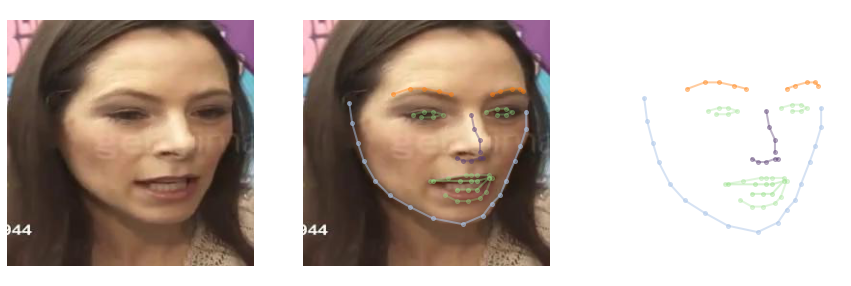

In [9]:
image_path = "./vox1-ex/0.jpg"
det = fa.get_landmarks_from_image(image_path)

plot_landmark(image_path, det[0])

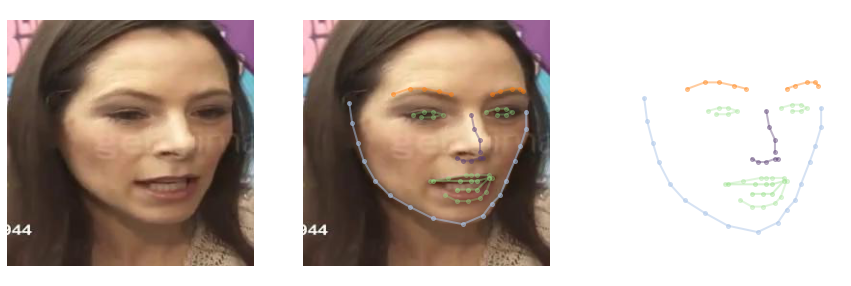

<Figure size 432x288 with 0 Axes>

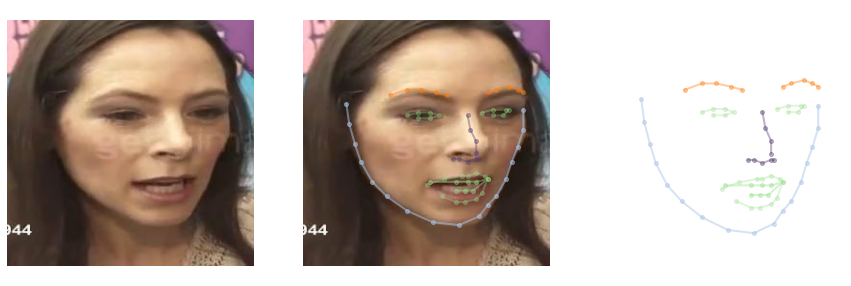

<Figure size 432x288 with 0 Axes>

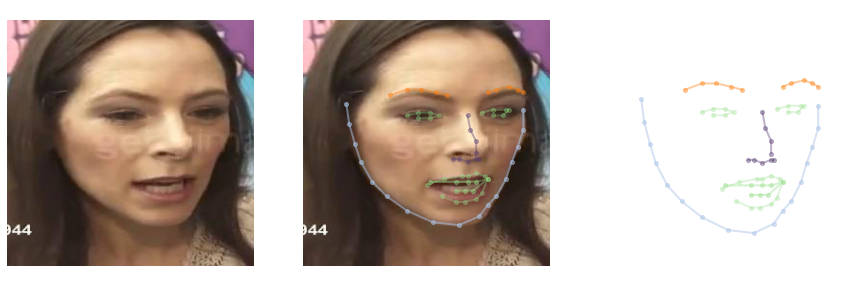

<Figure size 432x288 with 0 Axes>

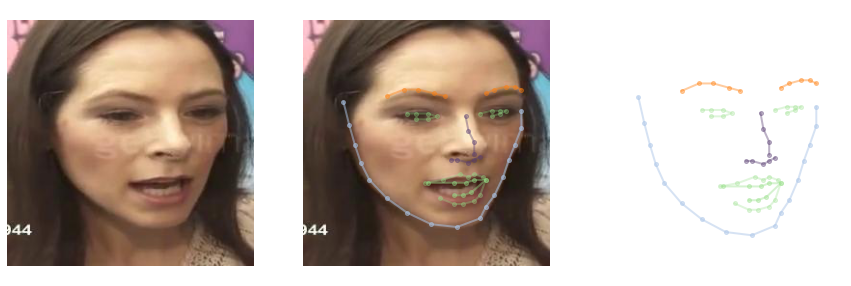

<Figure size 432x288 with 0 Axes>

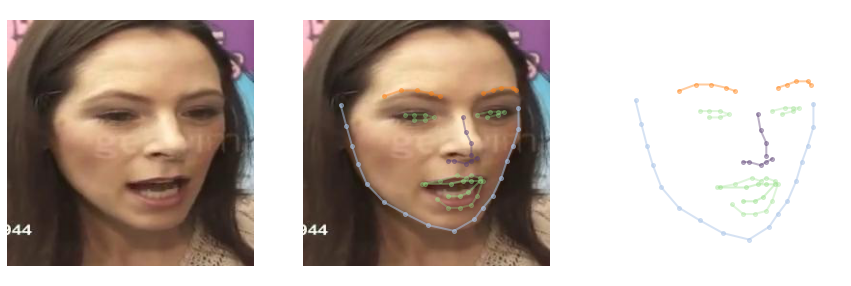

<Figure size 432x288 with 0 Axes>

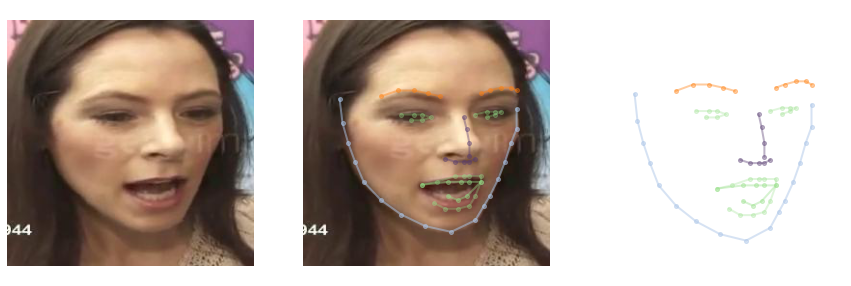

<Figure size 432x288 with 0 Axes>

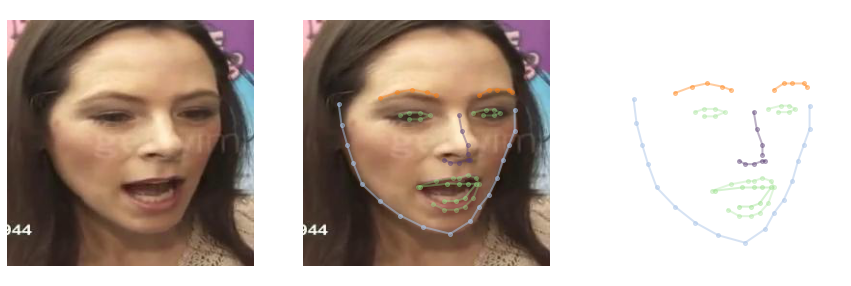

<Figure size 432x288 with 0 Axes>

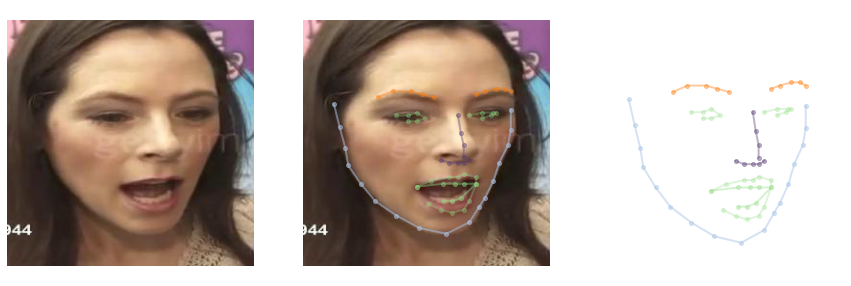

<Figure size 432x288 with 0 Axes>

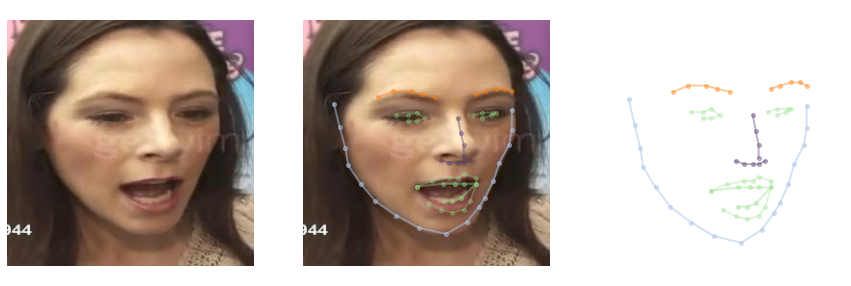

<Figure size 432x288 with 0 Axes>

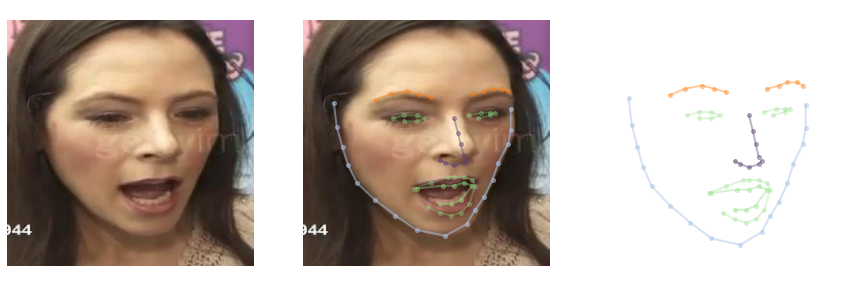

<Figure size 432x288 with 0 Axes>

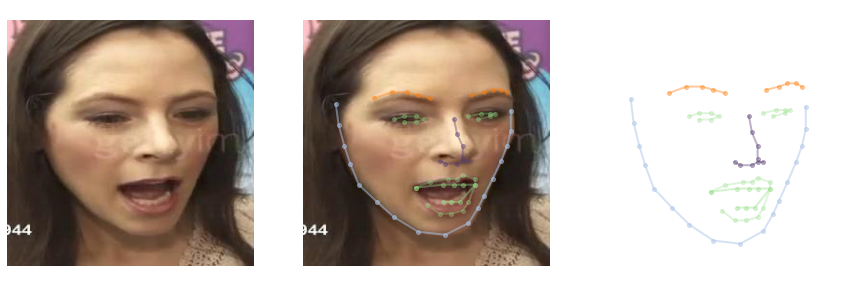

<Figure size 432x288 with 0 Axes>

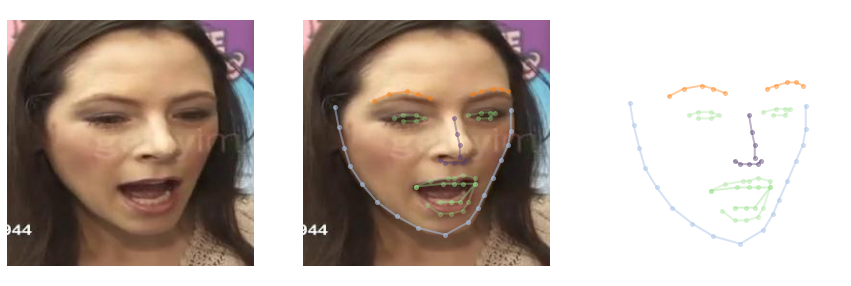

<Figure size 432x288 with 0 Axes>

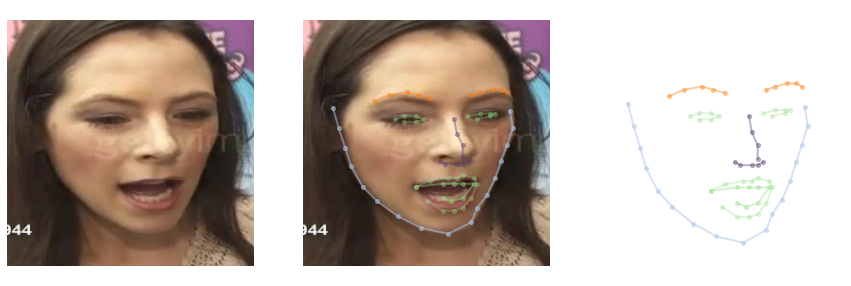

<Figure size 432x288 with 0 Axes>

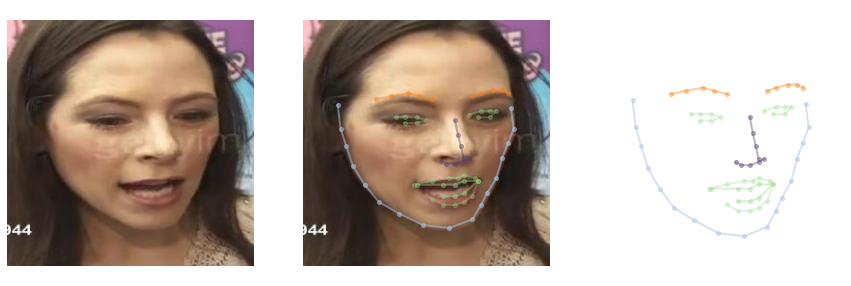

<Figure size 432x288 with 0 Axes>

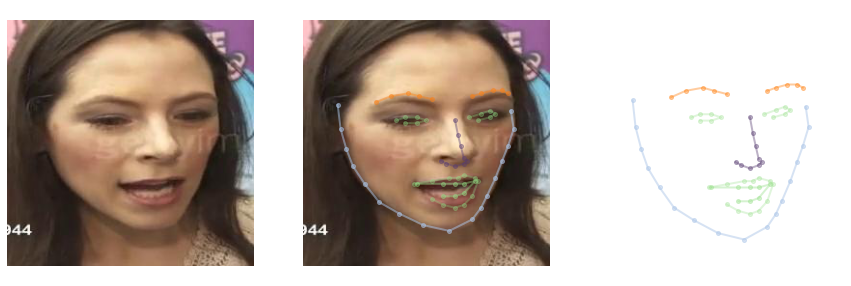

<Figure size 432x288 with 0 Axes>

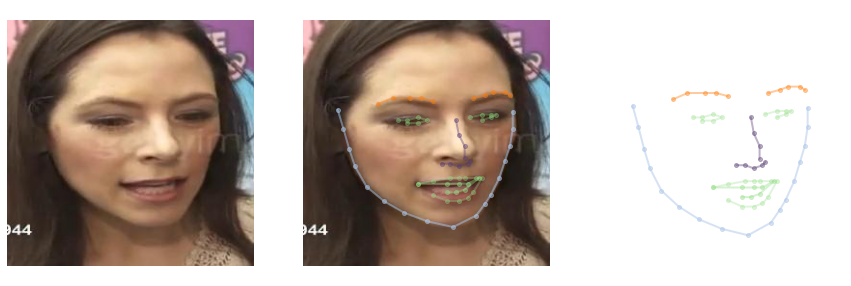

<Figure size 432x288 with 0 Axes>

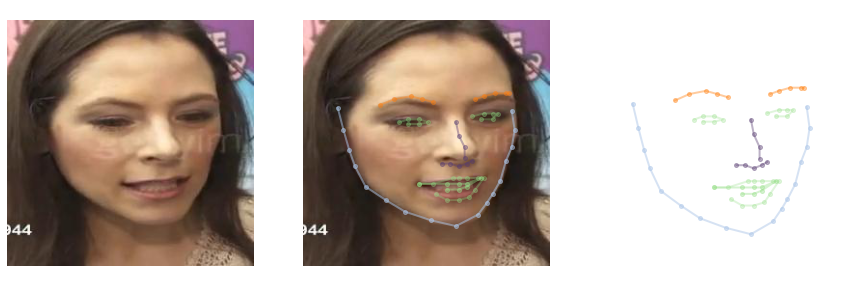

<Figure size 432x288 with 0 Axes>

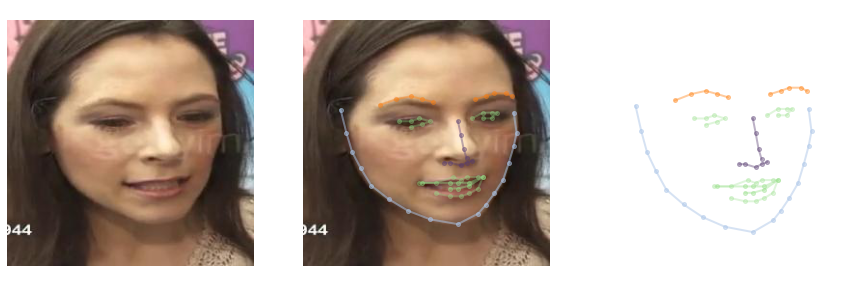

<Figure size 432x288 with 0 Axes>

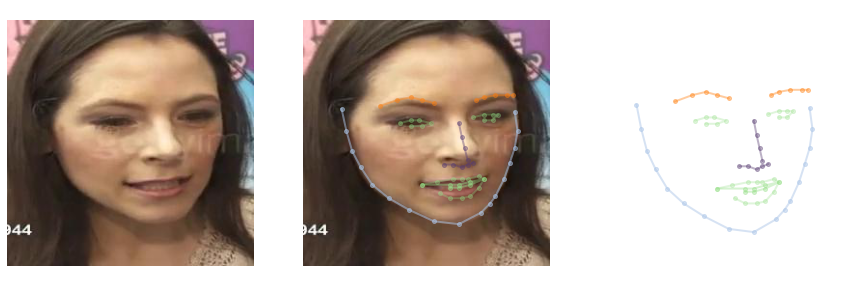

<Figure size 432x288 with 0 Axes>

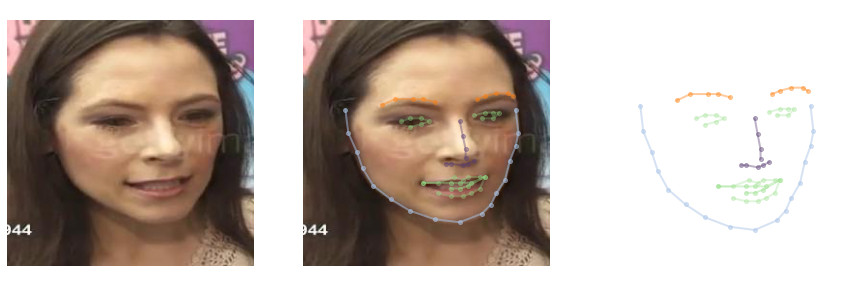

<Figure size 432x288 with 0 Axes>

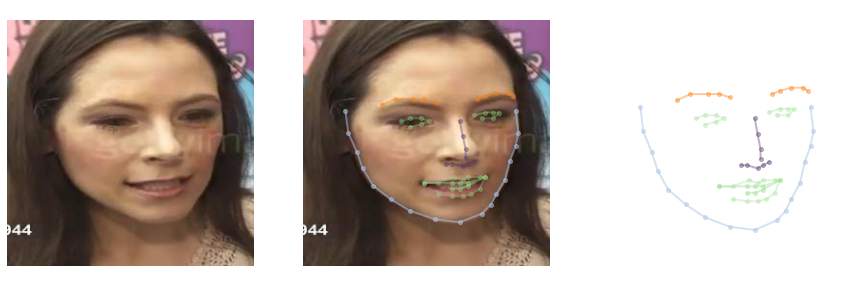

<Figure size 432x288 with 0 Axes>

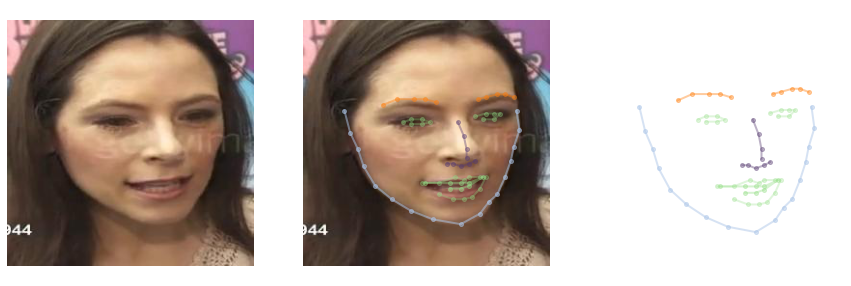

<Figure size 432x288 with 0 Axes>

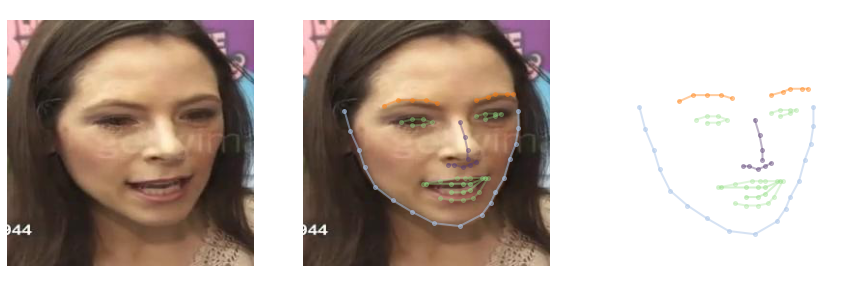

<Figure size 432x288 with 0 Axes>

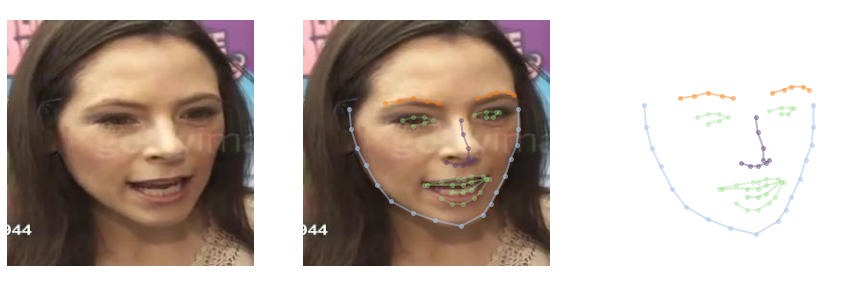

<Figure size 432x288 with 0 Axes>

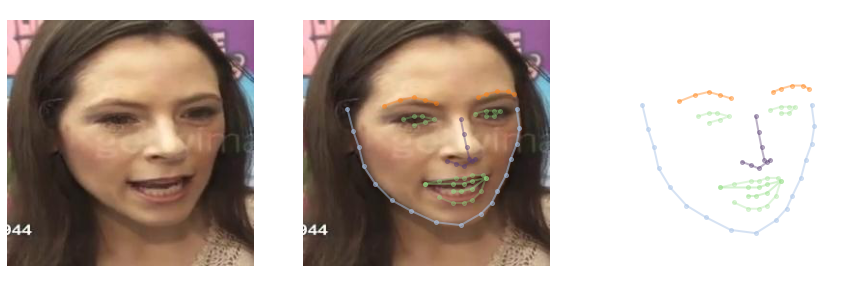

<Figure size 432x288 with 0 Axes>

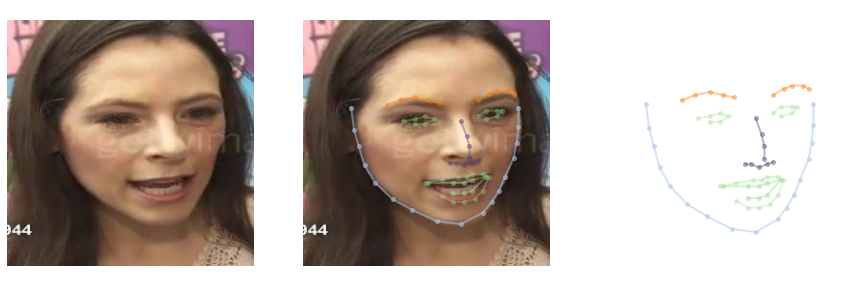

<Figure size 432x288 with 0 Axes>

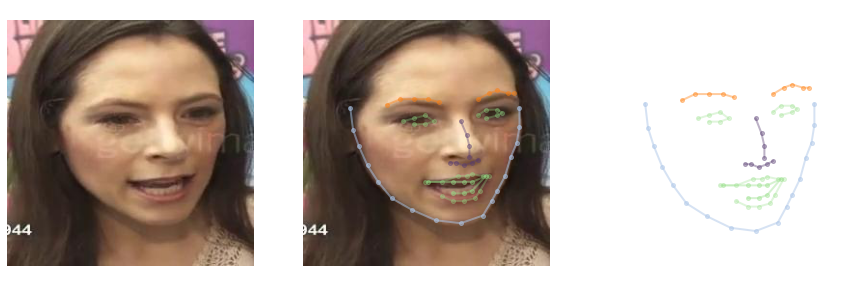

<Figure size 432x288 with 0 Axes>

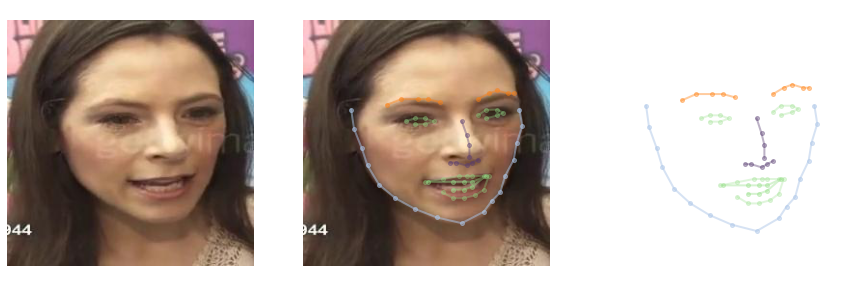

<Figure size 432x288 with 0 Axes>

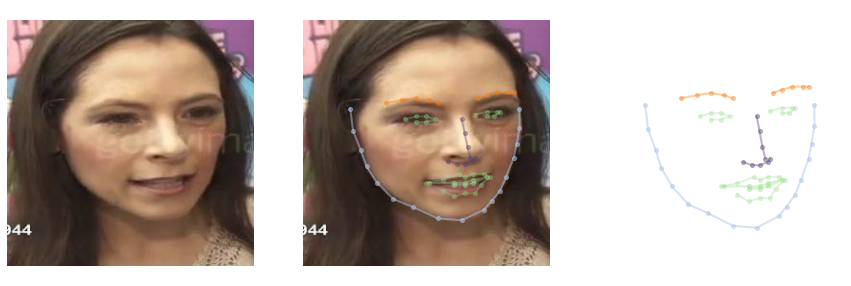

<Figure size 432x288 with 0 Axes>

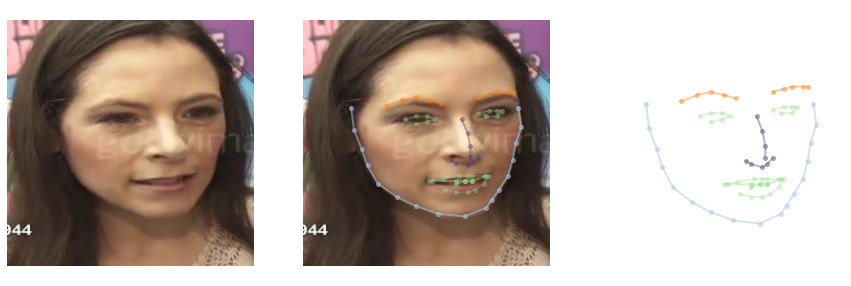

<Figure size 432x288 with 0 Axes>

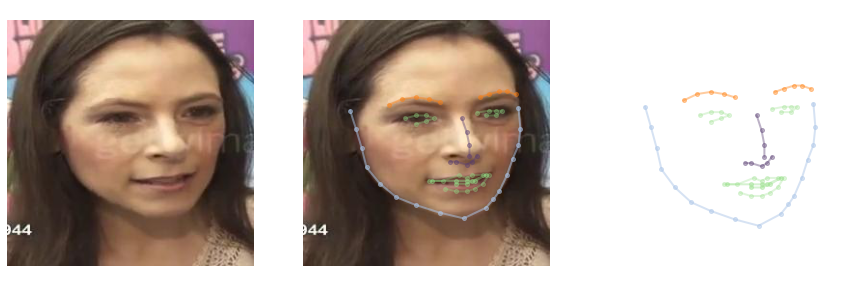

<Figure size 432x288 with 0 Axes>

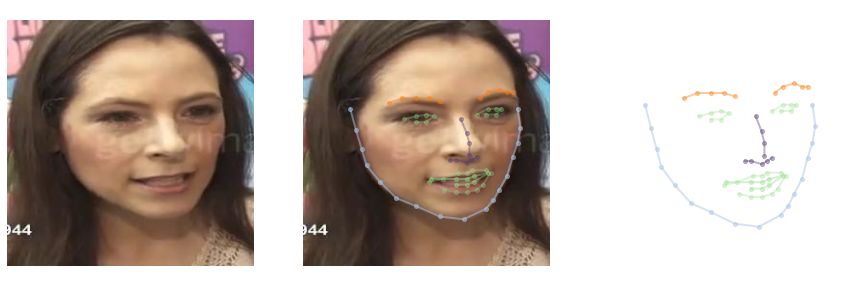

<Figure size 432x288 with 0 Axes>

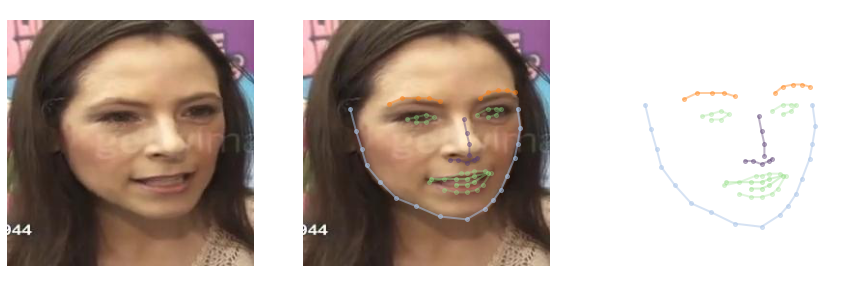

<Figure size 432x288 with 0 Axes>

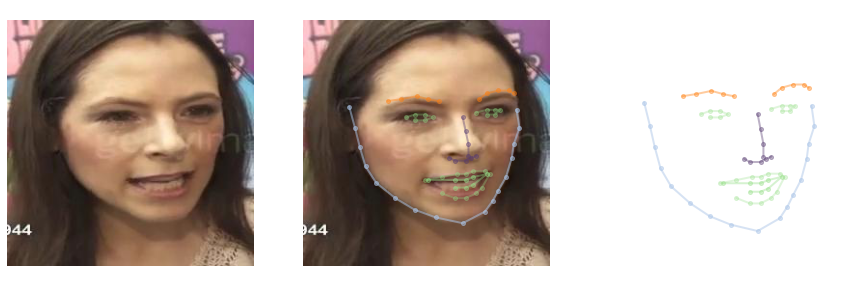

<Figure size 432x288 with 0 Axes>

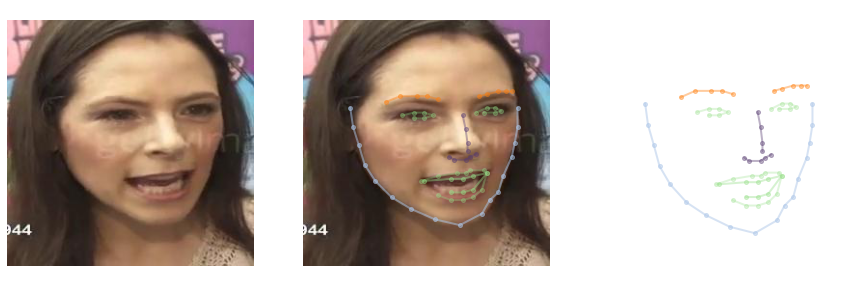

<Figure size 432x288 with 0 Axes>

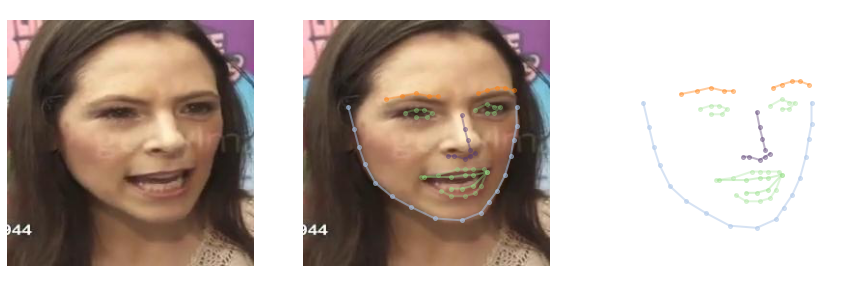

<Figure size 432x288 with 0 Axes>

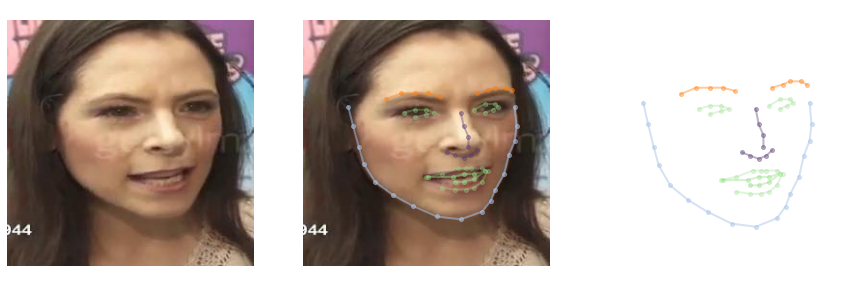

<Figure size 432x288 with 0 Axes>

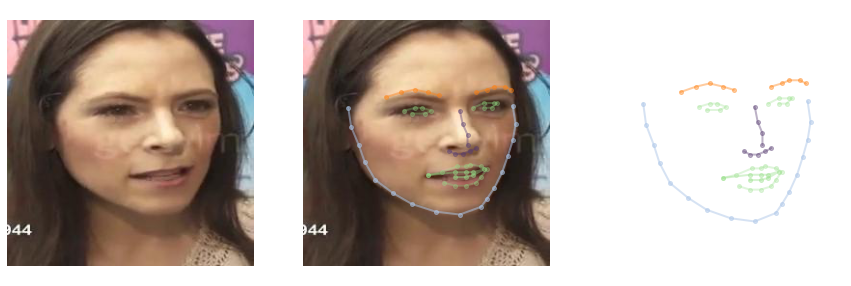

<Figure size 432x288 with 0 Axes>

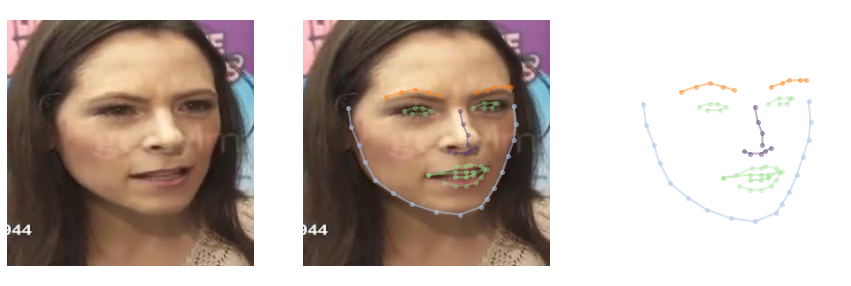

<Figure size 432x288 with 0 Axes>

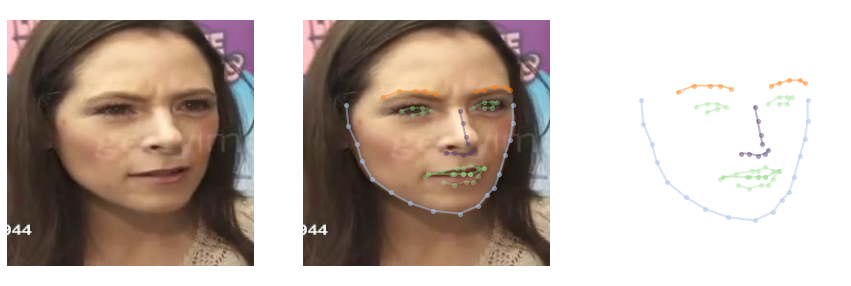

<Figure size 432x288 with 0 Axes>

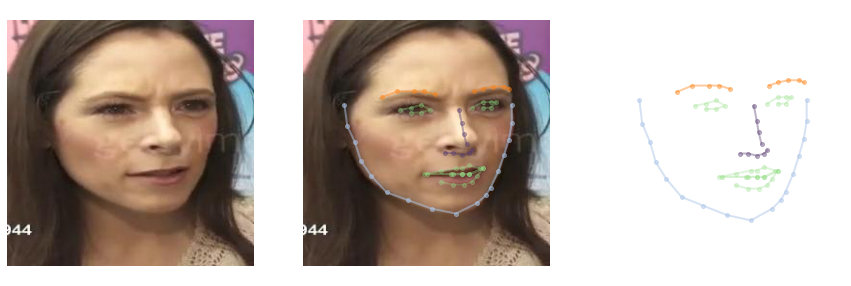

<Figure size 432x288 with 0 Axes>

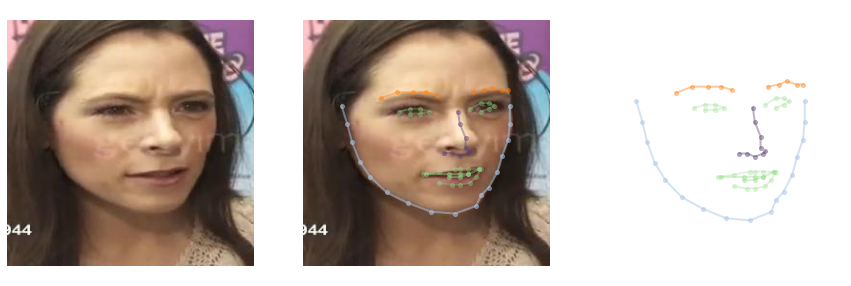

<Figure size 432x288 with 0 Axes>

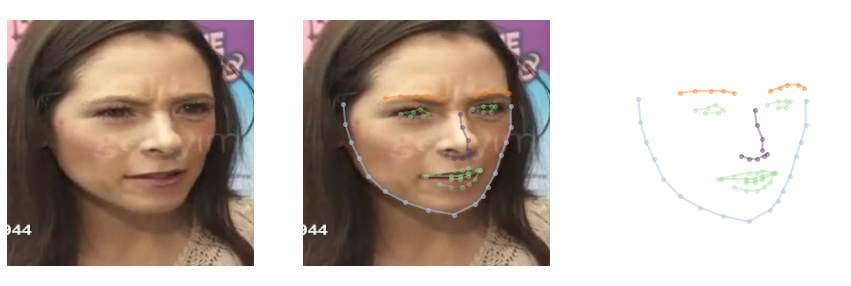

<Figure size 432x288 with 0 Axes>

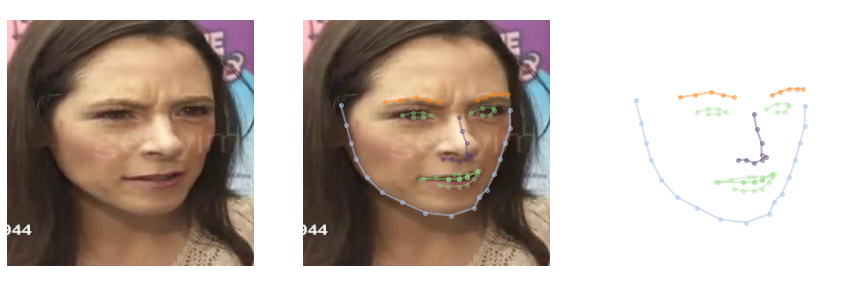

<Figure size 432x288 with 0 Axes>

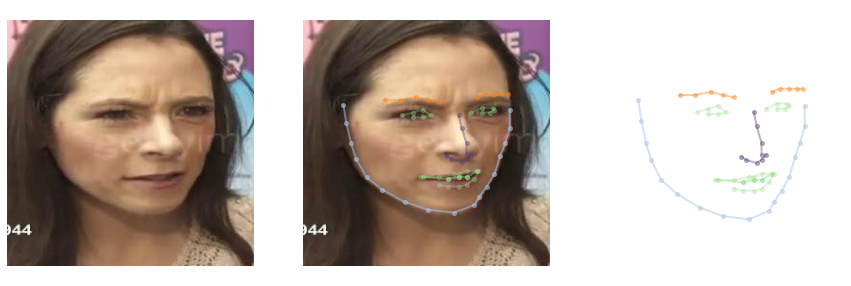

<Figure size 432x288 with 0 Axes>

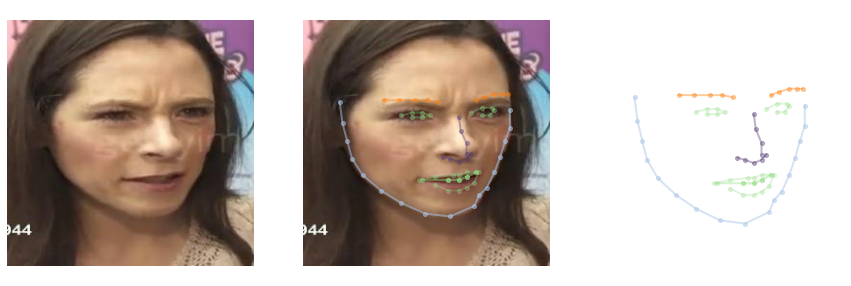

<Figure size 432x288 with 0 Axes>

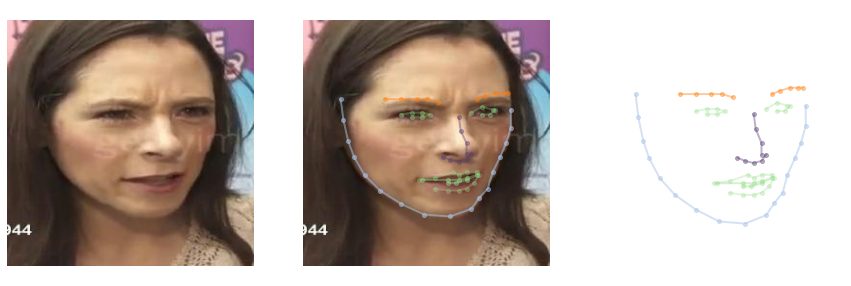

<Figure size 432x288 with 0 Axes>

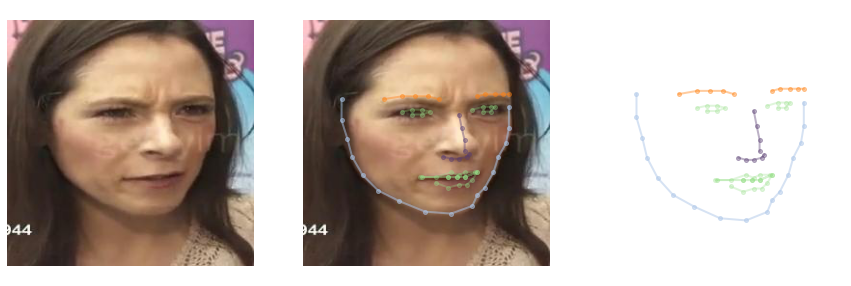

<Figure size 432x288 with 0 Axes>

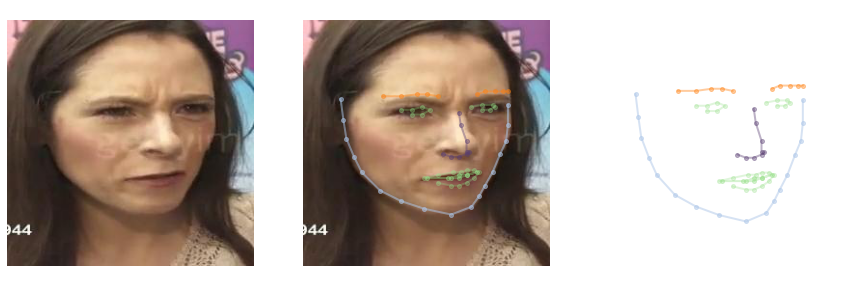

<Figure size 432x288 with 0 Axes>

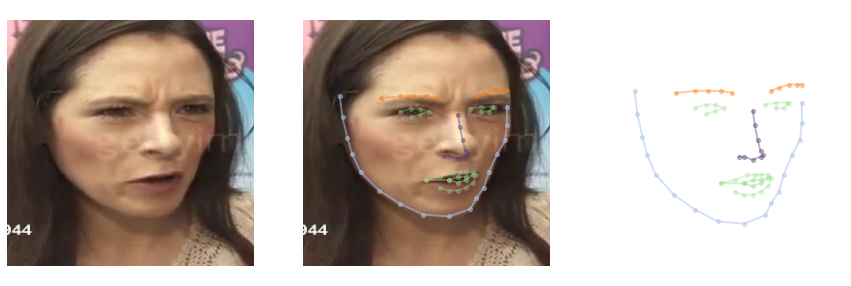

<Figure size 432x288 with 0 Axes>

In [13]:
# Video
image_path = "./vox1-ex"
landmark_path = "./landmark"
if not os.path.exists(landmark_path):
    os.makedirs(landmark_path)

image_list = natsort.natsorted(os.listdir(image_path))

image_paths = [ os.path.join(image_path, im) for im in image_list if im.endswith('.jpg')] #[256,256,3] 

#len_image = len(image_array)
len_image = 50

for i in range(0, len_image):
    det = fa.get_landmarks_from_image(image_paths[i])
    plot_landmark(image_paths[i], det[0], save_image=True, i=i)

In [11]:
speed_sec = { 'duration': 0.3 } #사진 넘기는 시간

landmark_images = [os.path.join(landmark_path, f"image_with_landmark{i}.png") for i in range(len_image)]

images = []
for im in landmark_images:
    images.append(imageio.imread(im))

imageio.mimsave(os.path.join(landmark_path, 'image_with_landmark.gif'), images, **speed_sec)


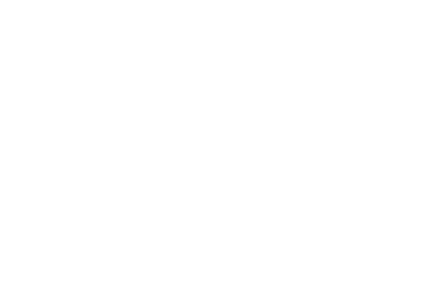

In [12]:
from IPython.display import Image
Image(open(os.path.join(landmark_path, 'image_with_landmark.gif'),'rb').read())